In [262]:
import pywt
import matplotlib.image as mpimg
import matplotlib.pylab as plt
from itertools import chain

import numpy as np
%matplotlib inline

# All the helper functions 

In [263]:
def rescale_image(old_image):
    OldRange = (np.max(old_image) - np.min(old_image))  
    NewRange = (255 - 0)  
    NewValue = (((old_image - np.min(old_image) ) * NewRange) / OldRange) 
    return NewValue

In [264]:
def clamp(image):
    data = np.copy(image)
    mask1 = data > 255
    data[mask1] = 255
    mask2 = data < 0 
    data[mask2] = 0
    
    return data

In [265]:
def visualize_coeffs(coeffs):
    levels = len(coeffs) - 1
    fig, axs = plt.subplots(levels, 3 ,figsize = (levels * 3, 9))
    axs = axs.ravel()
    
    for i,j in zip(range(0,levels*3,3) , range(1,levels+1)):
        axs[i].imshow(coeffs[j][0], 'gray')
        axs[i].set_title('Horizontal Coefficients \n level ' + str(j))
        axs[i+1].imshow(coeffs[j][1], 'gray')
        axs[i+1].set_title('Vertical Coefficients \n level ' + str(j))
        axs[i+2].imshow(coeffs[j][2], 'gray')
        axs[i+2].set_title('Diagonal Coefficients \n level ' + str(j))
        
    fig.tight_layout()

    


In [266]:
def visualize_coeffs_tiled(coeffs, figsize):
    levels = len(coeffs) - 1
    
    image_size = 0
    for i in range(len(coeffs)): 
        image_size = coeffs[i][0].shape[0] + image_size
    
    temp = rescale_image(coeffs[0])    
    for i in range(1, levels+1):
        temp1 = np.hstack((temp, rescale_image(coeffs[i][0])))
        temp2 = np.hstack((rescale_image(coeffs[i][1]), rescale_image(coeffs[i][2])))
        temp = np.vstack((temp1, temp2))
    plt.figure(figsize= figsize)
    
    plt.imshow(temp, 'gray')
    plt.xlim(-.5,image_size-.5)
    plt.ylim(image_size-.5,-.5)  
    plt.axis('off')

    # Add lines
    for i in range(levels): 
        plt.plot([image_size/(2)**(i+1)-.5, image_size/2**(i+1)-.5], [0-.5, image_size/ 2**(i) -.5], color='y', linestyle='-', linewidth=1)
        plt.plot([0, image_size/ 2**(i)-.5],[image_size/(2)**(i+1)-.5, image_size/2**(i+1)-.5], color='y', linestyle='-', linewidth=1)



In [267]:
def threshold(coeffs, thresholds, mode): 
    '''mode: soft vs. hard'''
    coeffs_new = [coeffs[0]]
    
    for i in range(len(thresholds)):
        cH_new =  pywt.threshold(coeffs[i+1][0], thresholds[i], mode)
        cV_new =  pywt.threshold(coeffs[i+1][1], thresholds[i], mode)
        cD_new =  pywt.threshold(coeffs[i+1][2], thresholds[i], mode)
        coeffs_new.append((cH_new, cV_new, cD_new))


    return coeffs_new

In [268]:
def block_threshold_fixed_scale(coeffs, threshold, neighbor_size):
    '''coeffs: only one scale coeffs, 
    threshold: a scalar
    neiber_size: a scalar giving the length of the square neighbor'''
    neighbor_num = coeffs.shape[0]/neighbor_size
    if neighbor_num != int(neighbor_num):
        raise ValueError('neighbor size must be consistent with the coeffs dimensions')
    
    # Create the neighbors
    splitted_x_axis = np.split(coeffs, neighbor_num, 0) # split along the x axis
    splitter_y_axis = lambda x: np.split(x, neighbor_num, 1)
    neighbors = np.array(list(map(splitter_y_axis , splitted_x_axis)))

    # find norms in neighbors
    norms = np.array([list(map(np.linalg.norm, neigh)) for neigh in neighbors])
    mask = (norms < threshold)
    neighbors[mask] = 0
    
    thresholded_coeffs = neighbors.swapaxes(1, 2).reshape(coeffs.shape)
    
    return thresholded_coeffs



In [269]:
def block_threshold(coeffs, thresholds, neighbor_sizes): 
    '''coeffs: all coeffs from decomposition
    threshold: all thresholds'''
    coeffs_new = [coeffs[0]]
    
    for i in range(len(thresholds)):
        cH_new =  block_threshold_fixed_scale(coeffs[i+1][0], thresholds[i], neighbor_sizes[i])
        cV_new =  block_threshold_fixed_scale(coeffs[i+1][1], thresholds[i], neighbor_sizes[i])
        cD_new =  block_threshold_fixed_scale(coeffs[i+1][2], thresholds[i], neighbor_sizes[i])
        coeffs_new.append((cH_new, cV_new, cD_new))


    return coeffs_new
    
    
    
    

# Load image 

(1024, 1024)

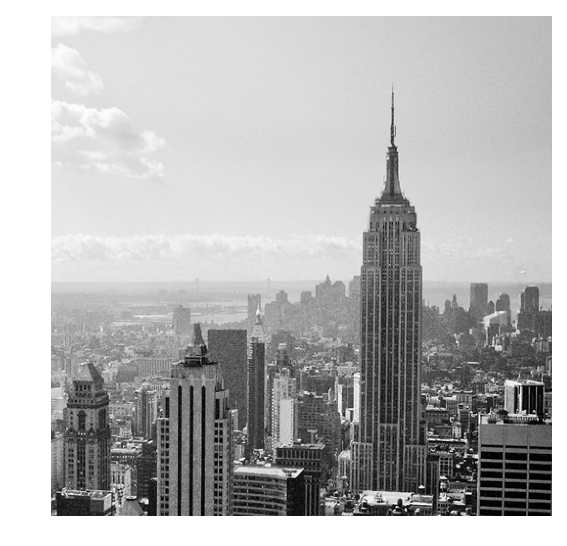

In [270]:
data = mpimg.imread('nyc.jpg')
data = data.astype('float32')[:,:,2]


fig = plt.figure(frameon=False)
fig.set_size_inches(5,5)
ax = plt.Axes(fig, [0., 0., 1, 1])
ax.set_axis_off()
fig.add_axes(ax)
imgplot = plt.imshow(data, 'gray')
plt.savefig('clean_image.png')
data.shape

# Decomposition of the clean image at one level

In [271]:
coeffs = pywt.dwt2(data, 'haar' )


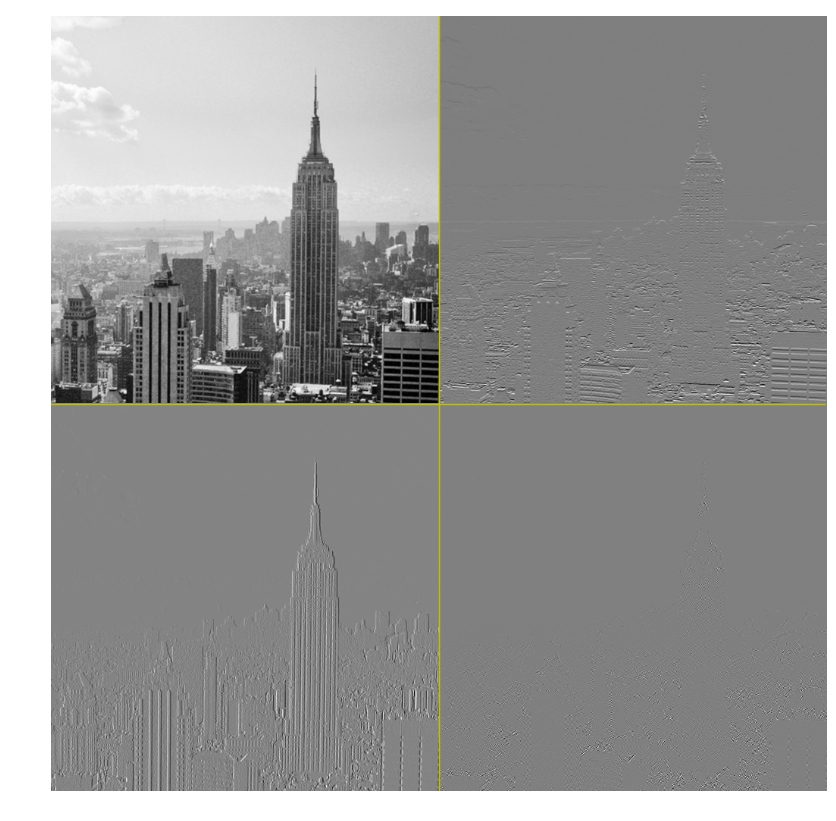

In [272]:
visualize_coeffs_tiled(coeffs,(10,10))


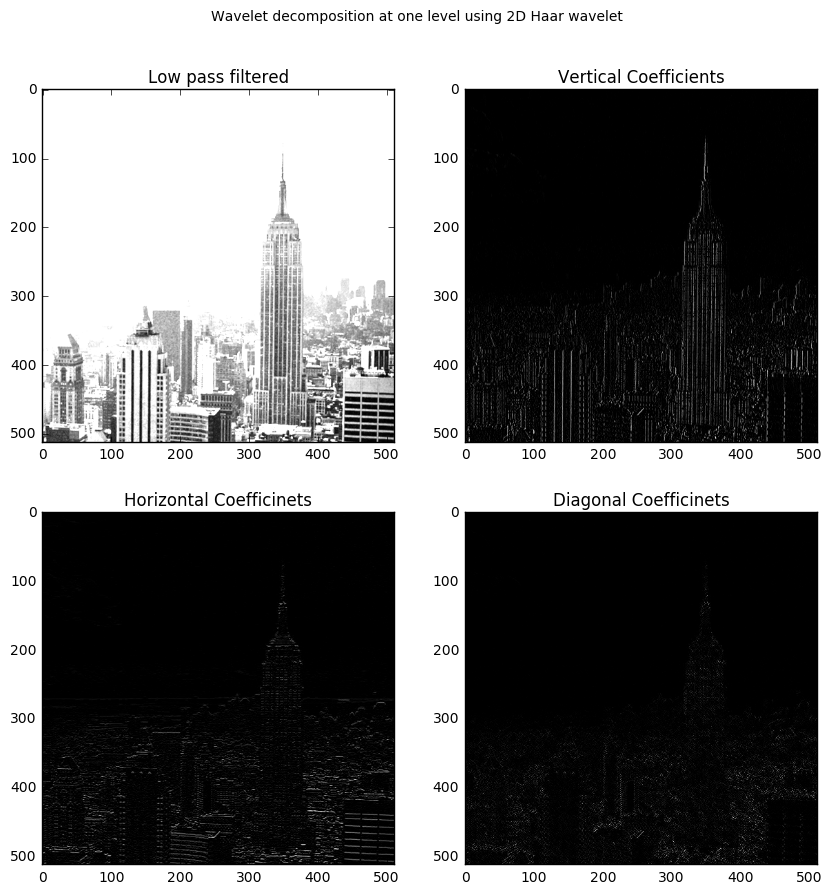

In [273]:
# This is an example of Clamoing the coeffs instead of rescaling them. 
cA, (cH, cV, cD) = coeffs

plt.figure(figsize = (10,10))

f, ((ax1, ax2), (ax3, ax4)) = plt.subplots(2, 2, figsize = (10,10))
f.suptitle('Wavelet decomposition at one level using 2D Haar wavelet')

ax1.imshow(clamp(cA), 'gray')
ax1.set_title('Low pass filtered')

ax2.imshow(clamp(cV), 'gray')
ax2.set_title('Vertical Coefficients')

ax3.imshow(clamp(cH), 'gray')
ax3.set_title('Horizontal Coefficinets')

ax4.imshow(clamp(cD), 'gray')
ax4.set_title('Diagonal Coefficinets')



# multi level decomposition of the clean image

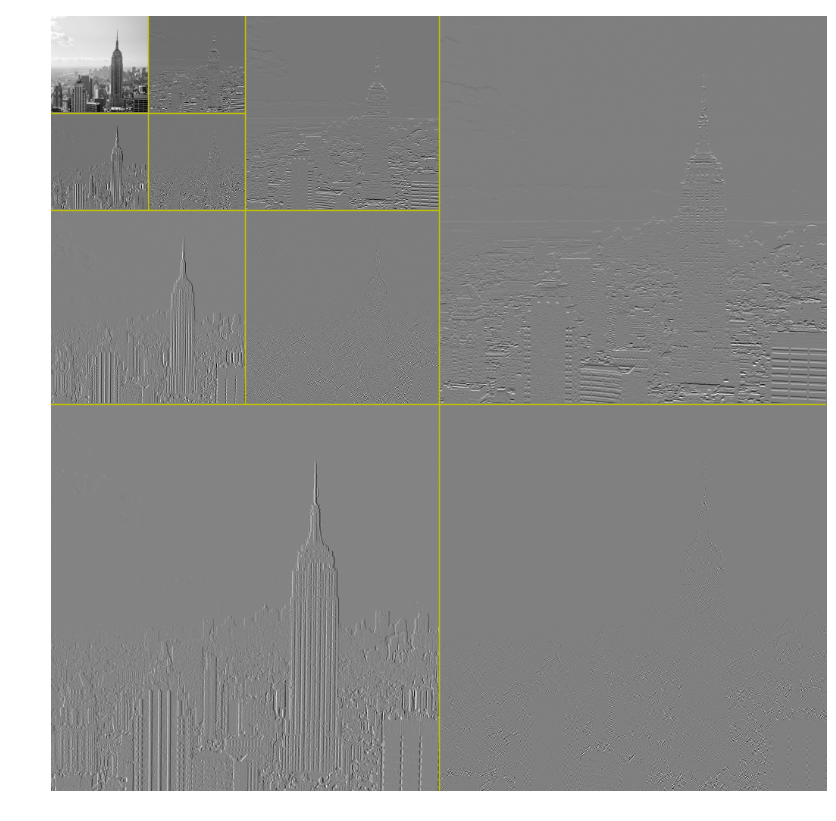

In [274]:
coeffs_multi = pywt.wavedec2(data, 'haar', level=3)

visualize_coeffs_tiled(coeffs_multi, (10,10))

plt.savefig('clean_image_coeffs.png')


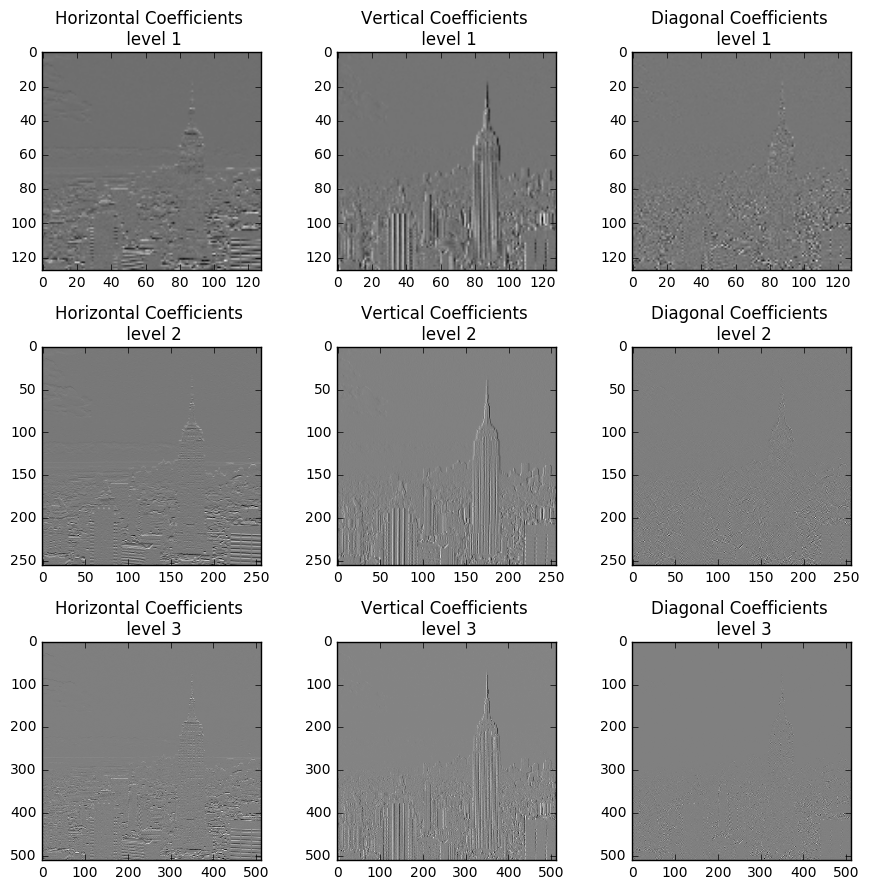

In [275]:
# Same coeffs in row format

cA, (cH3, cV3, cD3), (cH2, cV2, cD2) , (cH1, cV1, cD1)= coeffs_multi
visualize_coeffs(coeffs_multi)


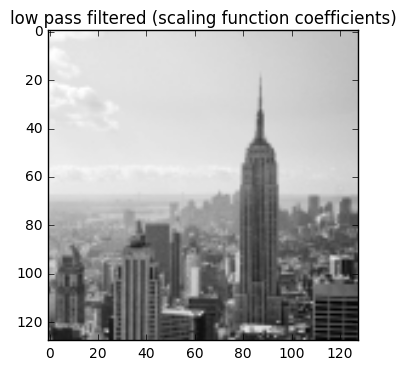

In [276]:
plt.imshow((cA), 'gray')
plt.title('low pass filtered (scaling function coefficients)')

# Multi level Decomposition of the Gaussian Noise 

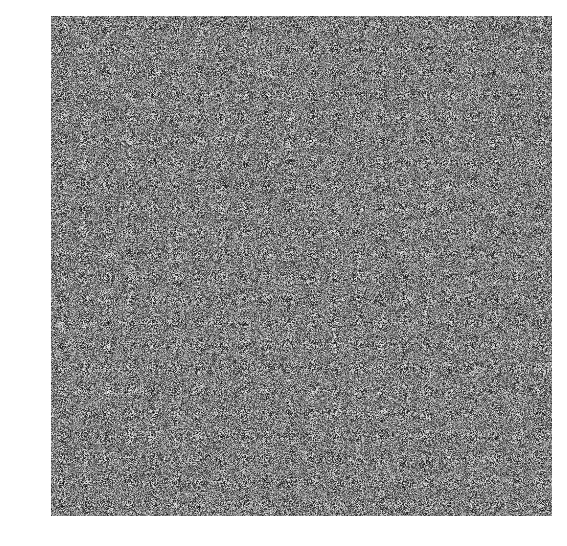

In [277]:
noise = rescale_image(np.random.rand(data.shape[0],data.shape[1] )) * 1
plt.figure(figsize=(4,4))

fig = plt.figure(frameon=False)
fig.set_size_inches(5,5)
ax = plt.Axes(fig, [0., 0., 1, 1])
ax.set_axis_off()
fig.add_axes(ax)
imgplot = plt.imshow(noise, 'gray')

plt.savefig('noise.png')


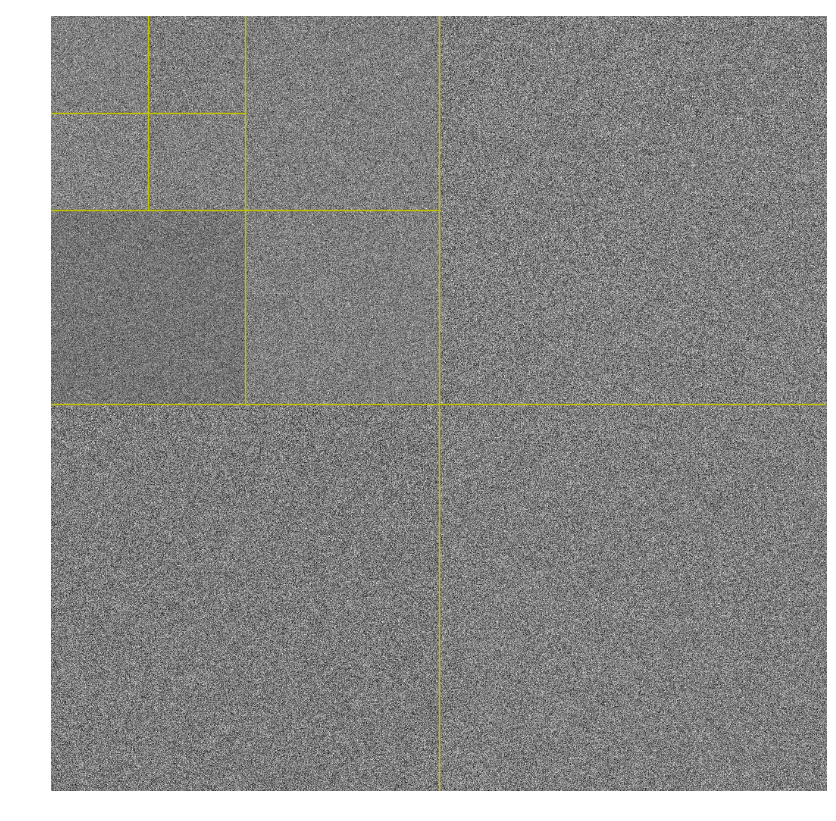

In [278]:
coeffs_multi_noise = pywt.wavedec2(noise, 'haar', level=3)
cA_n, (cH3_n, cV3_n, cD3_n), (cH2_n, cV2_n, cD2_n) , (cH1_n, cV1_n, cD1_n)= coeffs_multi_noise
visualize_coeffs_tiled(coeffs_multi_noise, (10,10))

plt.savefig('noise_coeffs.png')


# Multi level Decomposition of the Noisy image

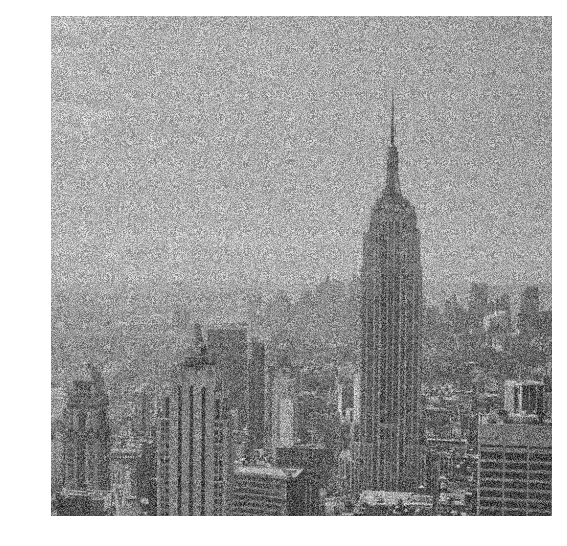

In [279]:
data_noisy = rescale_image(data + noise) 
fig = plt.figure(frameon=False)
fig.set_size_inches(5,5)
ax = plt.Axes(fig, [0., 0., 1, 1])
ax.set_axis_off()
fig.add_axes(ax)
imgplot = plt.imshow(data_noisy, 'gray')
plt.savefig('noisy_image.png')


In [280]:
# multi level decomposition

coeffs_multi_noisy = pywt.wavedec2(data_noisy, 'haar', level=3)

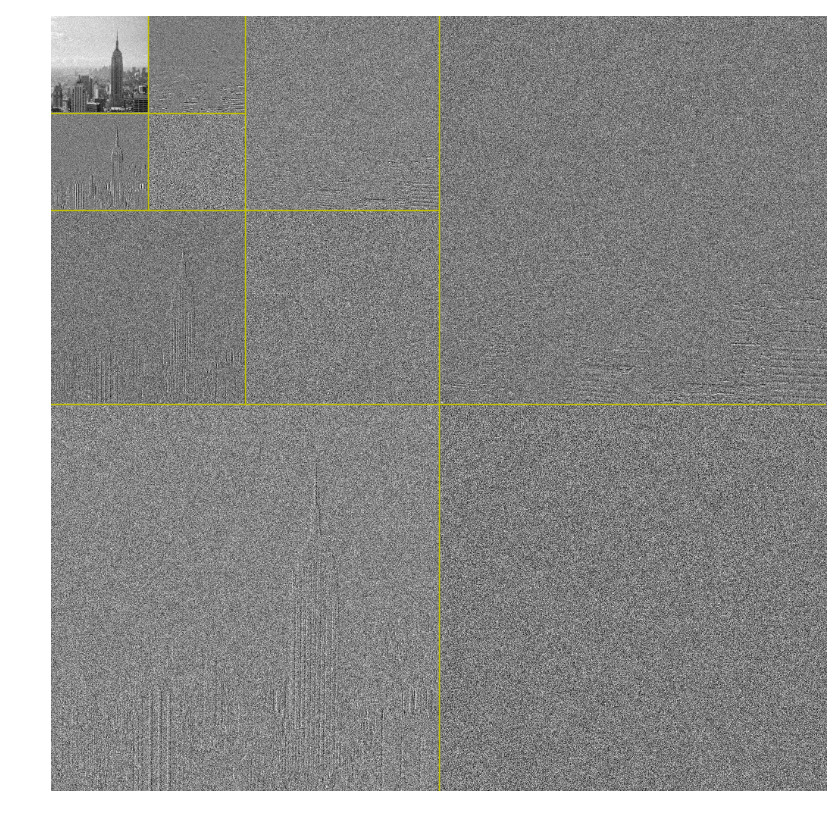

In [281]:
visualize_coeffs_tiled(coeffs_multi_noisy, (10,10))

plt.savefig('noisy_image_coeffs.png')


# Thresholding

In [25]:
# Check soft thresholding and hard thresholding of the package
# f, ((ax1, ax2)) = plt.subplots(1,2 , figsize = (10,5))

# ax1.scatter(cV2, pywt.threshold(cV2, 50, 'hard'))
# ax2.scatter(cV2, pywt.threshold(cV2, 50, 'soft'))


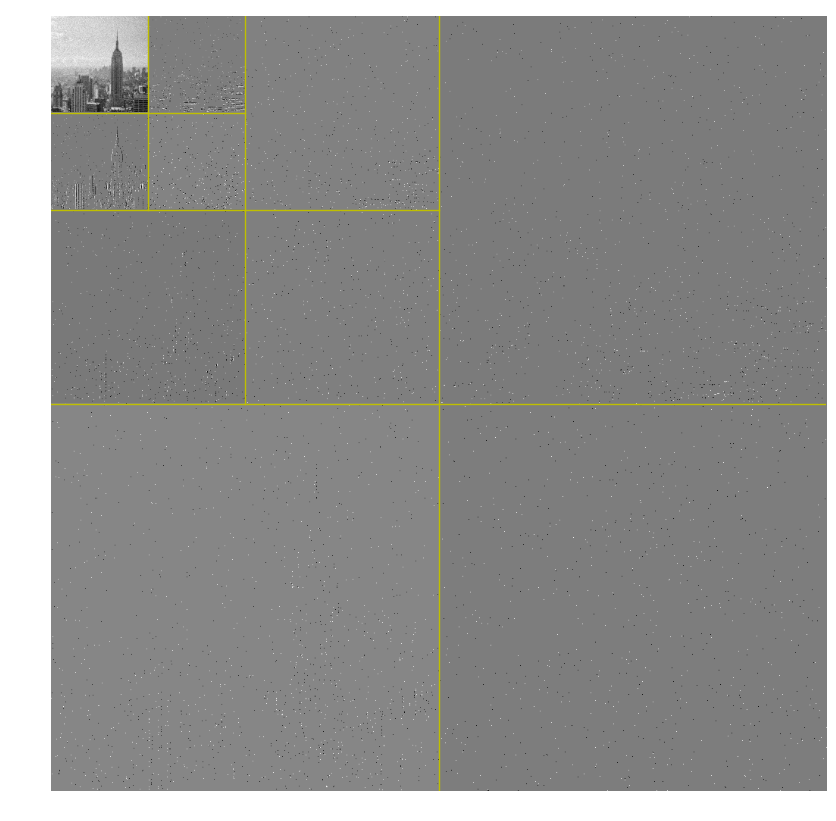

In [282]:
thresholded_coeffs = threshold(coeffs_multi_noisy, [90,100,100], 'hard')
# thresholded_coeffs = threshold(coeffs_multi_noisy, [90,100,100], 'hard')

thresholded_coeffs_tile = visualize_coeffs_tiled(thresholded_coeffs , (10,10))


plt.savefig('noisy_image_coeffs_thresholded.png')


# Reconstruct image from the thresholded coeffs

In [283]:
recon_image = pywt.waverec2(thresholded_coeffs,'haar')


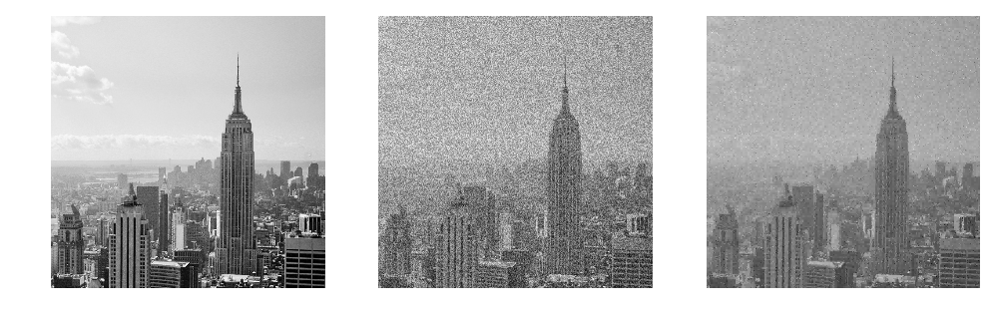

In [284]:
f, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize = (12,4))

ax1.imshow(data, 'gray')
ax1.set_axis_off()
ax2.imshow(data_noisy, 'gray')
ax2.set_axis_off()

ax3.imshow(clamp(recon_image), 'gray')
ax3.set_axis_off()
plt.savefig('denosied_image.png')


# Block thresholding

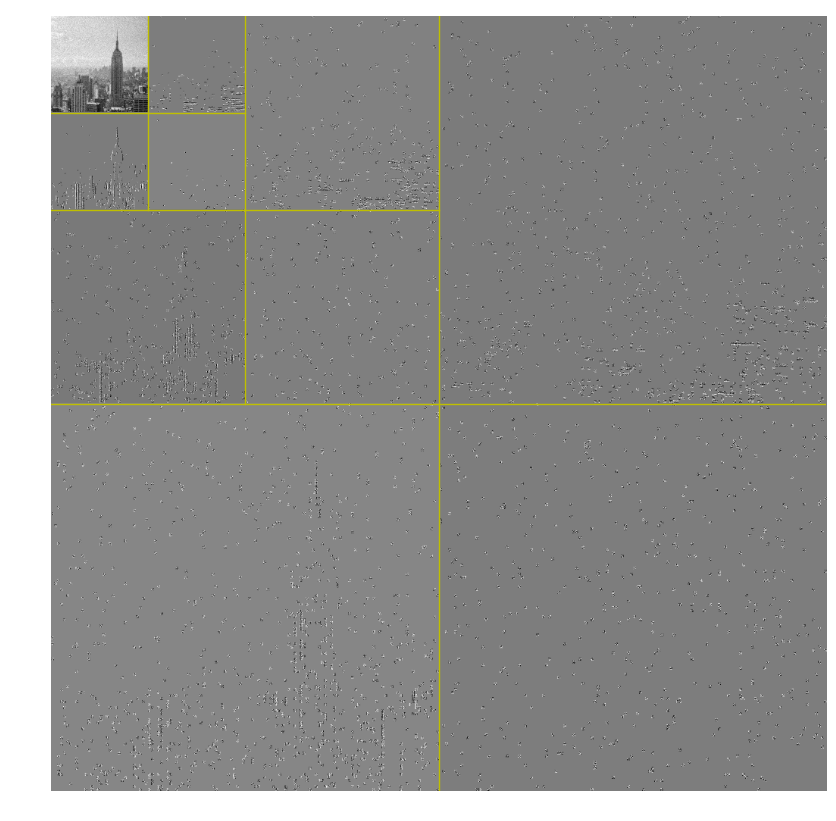

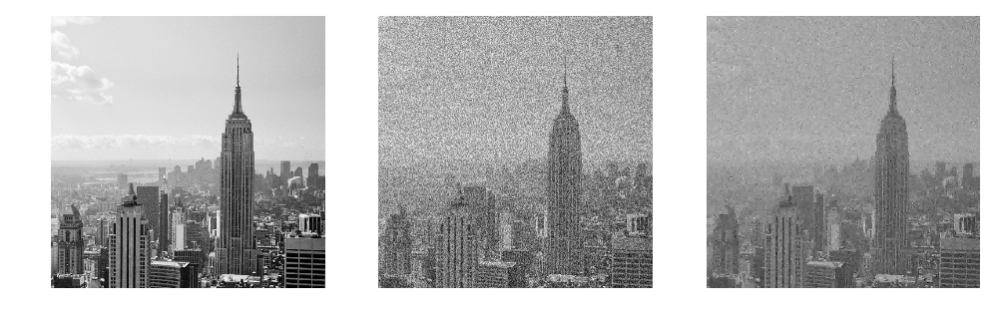

In [285]:
# block_thresholded_coeffs = block_threshold(coeffs_multi_noisy, [150,190,190], [2,4,4])

block_thresholded_coeffs = block_threshold(coeffs_multi_noisy, [150,190,190], [2,4,4])
visualize_coeffs_tiled(block_thresholded_coeffs, (10,10))

plt.savefig('noisy_image_coeffs_block_thresholded.png')

recon_image_block = pywt.waverec2(block_thresholded_coeffs,'haar')

f, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize = (12,4))
ax1.imshow(data, 'gray')
ax1.set_axis_off()
ax2.imshow(data_noisy, 'gray')
ax2.set_axis_off()
ax3.imshow(rescale_image(recon_image_block), 'gray')
ax3.set_axis_off()
plt.savefig('denosied_image_block.png')


# Compare Block thresholding and thresholding

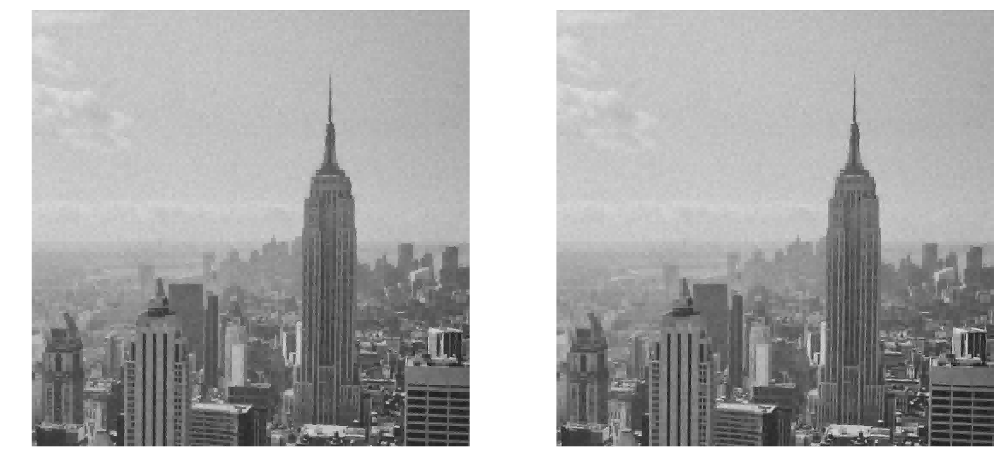

In [126]:
f, (ax1, ax2) = plt.subplots(1, 2, figsize = (20,10))

ax1.imshow(clamp(recon_image), 'gray')
# ax1.set_title('denoised image', fontsize = 20)
ax1.set_axis_off()

ax2.imshow(clamp(recon_image_block), 'gray')
# ax2.set_title('block thresholded denoised image', fontsize = 20)
ax2.set_axis_off()
plt.savefig('compare_images.png')


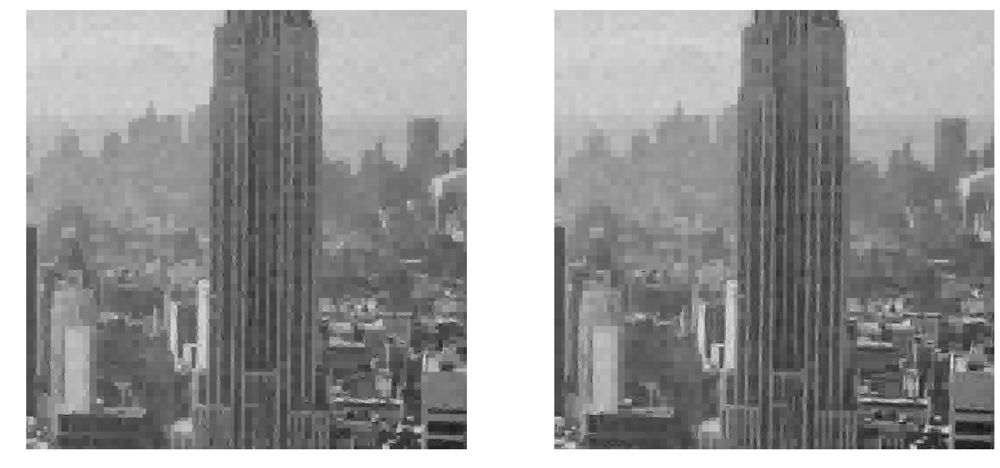

In [127]:
f, (ax1, ax2) = plt.subplots(1, 2, figsize = (20,10))

ax1.imshow(clamp(recon_image[-600:-100, -600:-100]), 'gray')
# ax1.set_title('denoised image', fontsize = 20)
ax1.set_axis_off()

ax2.imshow(clamp(recon_image_block[-600:-100, -600:-100]), 'gray')
# ax2.set_title('block thresholded denoised image', fontsize = 20)
ax2.set_axis_off()
plt.savefig('compare_images_zoomed_more.png')


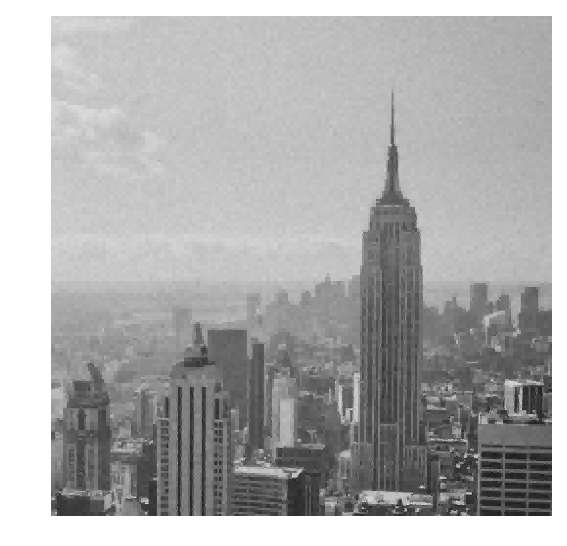

In [128]:

# ax1.set_title('denoised image', fontsize = 20)
fig = plt.figure(frameon=False)
fig.set_size_inches(5,5)
ax = plt.Axes(fig, [0., 0., 1, 1])
ax.set_axis_off()
fig.add_axes(ax)
plt.imshow(clamp(recon_image), 'gray')
plt.savefig('denoised.png')


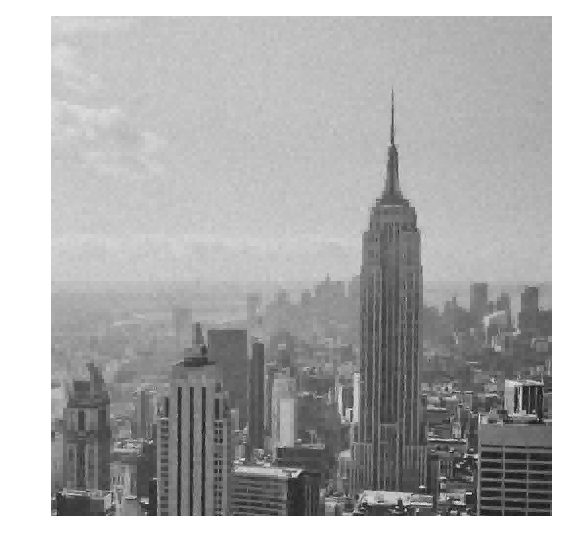

In [129]:
# ax2.set_title('block thresholded denoised image', fontsize = 20)




# ax1.set_title('denoised image', fontsize = 20)
fig = plt.figure(frameon=False)
fig.set_size_inches(5,5)
ax = plt.Axes(fig, [0., 0., 1, 1])
ax.set_axis_off()
fig.add_axes(ax)
plt.imshow(clamp(recon_image_block), 'gray')
plt.savefig('denoised_block.png')


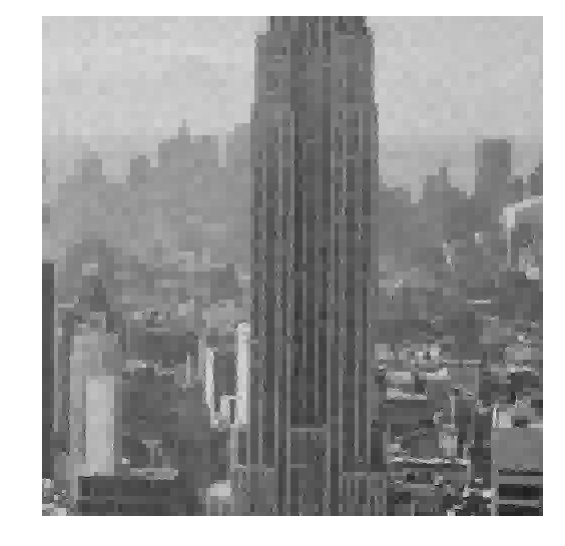

In [130]:

# ax1.set_title('denoised image', fontsize = 20)

fig = plt.figure(frameon=False)
fig.set_size_inches(5,5)
ax = plt.Axes(fig, [0., 0., 1, 1])
ax.set_axis_off()
fig.add_axes(ax)
plt.imshow(clamp(recon_image[-600:-100, -600:-100]), 'gray')
plt.savefig('denoised_zoom_less.png')


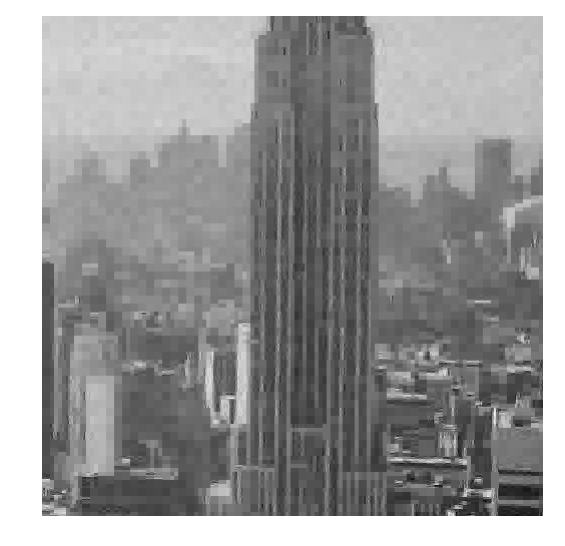

In [131]:
# ax2.set_title('block thresholded denoised image', fontsize = 20)



fig = plt.figure(frameon=False)
fig.set_size_inches(5,5)
ax = plt.Axes(fig, [0., 0., 1, 1])
ax.set_axis_off()
fig.add_axes(ax)
plt.imshow(clamp(recon_image_block[-600:-100, -600:-100]), 'gray')
plt.savefig('denoised_block_zoom_less.png')


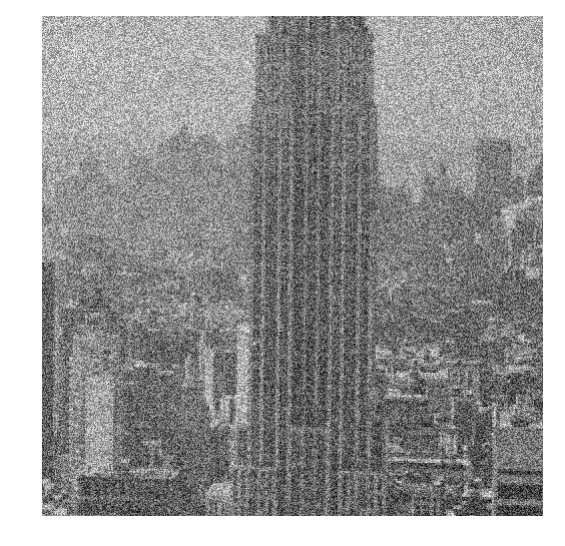

In [34]:
fig = plt.figure(frameon=False)
fig.set_size_inches(5,5)
ax = plt.Axes(fig, [0., 0., 1, 1])
ax.set_axis_off()
fig.add_axes(ax)
plt.imshow((data_noisy[-600:-100, -600:-100]), 'gray')
plt.savefig('noisy_image_high_noise_zooed.png')


# Visualize Haar coeffs

In [286]:
H = np.array([[ 1,  1,  1,  1,  1,  1,  1,  1],
       [ 1,  1,  1,  1, -1, -1, -1, -1],
       [ 1,  1, -1, -1,  0,  0,  0,  0],
       [ 0,  0,  0,  0,  1,  1, -1, -1],
       [ 1, -1,  0,  0,  0,  0,  0,  0],
       [ 0,  0,  1, -1,  0,  0,  0,  0],
       [ 0,  0,  0,  0,  1, -1,  0,  0],
       [ 0,  0,  0,  0,  0,  0,  1, -1]])
H = H/np.tile(np.linalg.norm(H, axis= 1), (8,1)).T #normalize


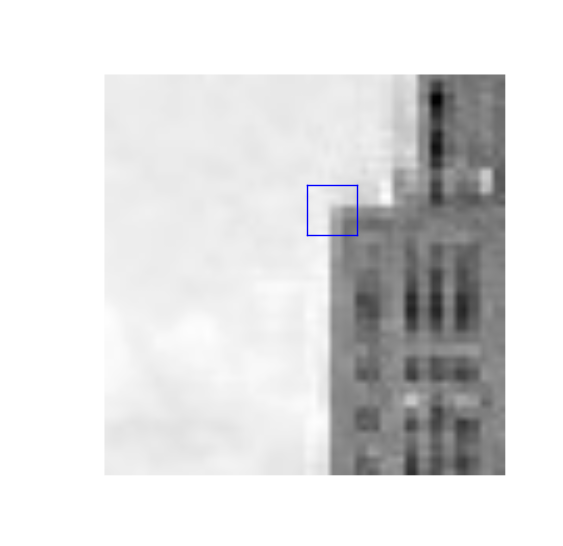

In [287]:
data = mpimg.imread('nyc_cropped.jpg')[:,:,2]

fig = plt.figure(frameon=False)
fig.set_size_inches(5,5)
ax = plt.Axes(fig, [0., 0., 1, 1])
ax.set_axis_off()
fig.add_axes(ax)

plt.imshow(data, 'gray')
plt.plot([32,40],[17,17], 'b')
plt.plot([32,40],[25,25], 'b')
plt.plot([32,32],[17,25], 'b')
plt.plot([40,40],[17,25], 'b')

plt.savefig('nyc_cropped.png')


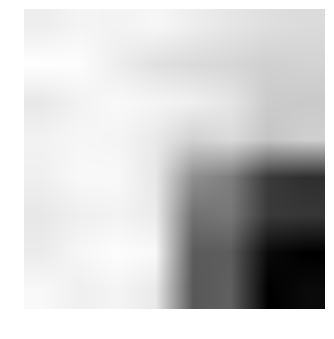

In [379]:
patch = data[17:25, 32:40]

fig = plt.figure(frameon=False)
fig.set_size_inches(3,3)
ax = plt.Axes(fig, [0., 0., 1, 1])
ax.set_axis_off()
fig.add_axes(ax)

plt.imshow(patch, 'gray')

plt.savefig('patch.png')


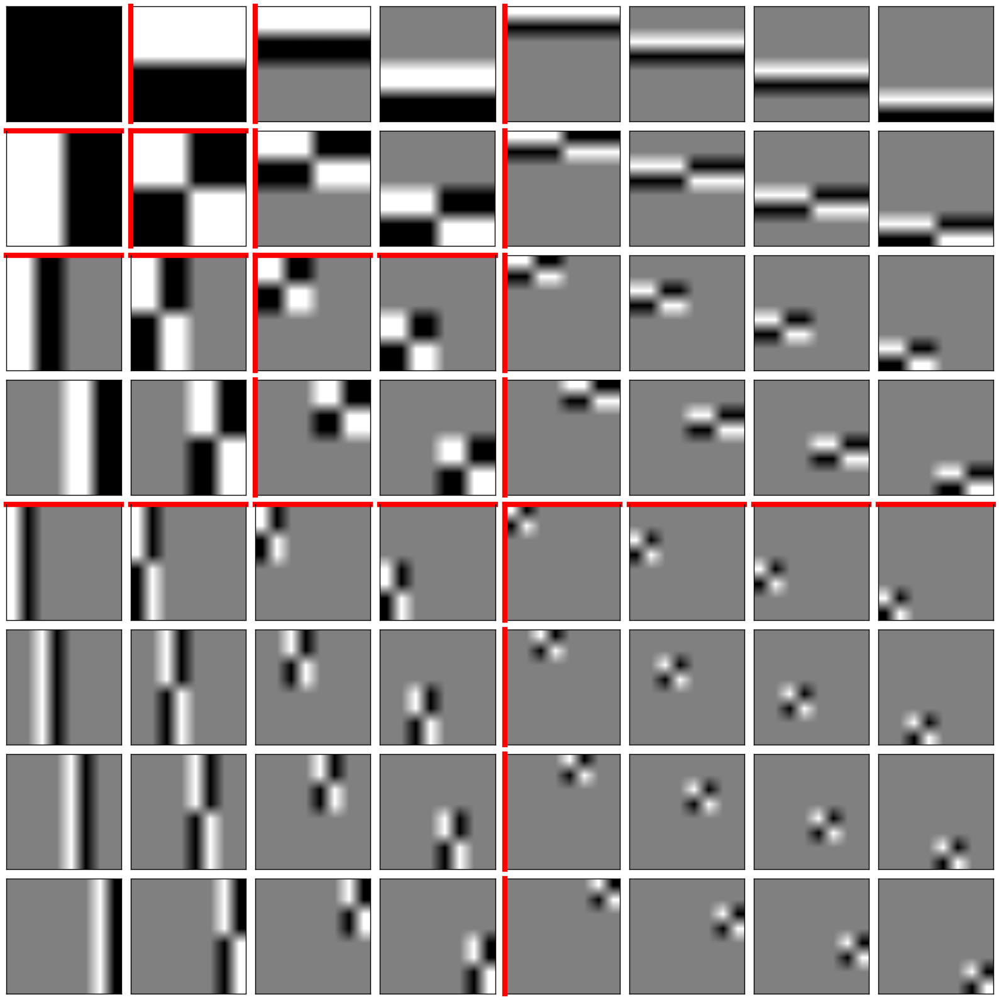

In [378]:
fig, axs = plt.subplots(8, 8 ,figsize = (16, 16))
axs = axs.ravel()
        
for i in range(8):
    for j in range(8):
        axs[i + j*8].imshow(np.outer(H[i,:],H[j,:]),'gray')
#         axs[i + j*8].axis('off')
#         axs[i + j*8].spines['right'].set_color('red')
#         axs[i + j*8].spines['left'].set_color('red')
        axs[i + j*8].get_xaxis().set_visible(False)
        axs[i + j*8].get_yaxis().set_visible(False)
        

for i in range(32,40):        
    axs[i].spines['top'].set_color('r')
    axs[i].spines['top'].set_linewidth(6)

for i in range(8):        
    axs[4 + i* 8].spines['left'].set_color('r')
    axs[4 + i* 8].spines['left'].set_linewidth(6)        
fig.tight_layout()


for i in range(16,20):        
    axs[i].spines['top'].set_color('r')
    axs[i].spines['top'].set_linewidth(6)

for i in range(4):        
    axs[2 + i* 8].spines['left'].set_color('r')
    axs[2 + i* 8].spines['left'].set_linewidth(6)
    
    
axs[9].spines['left'].set_color('r')
axs[9].spines['left'].set_linewidth(6)     
axs[1].spines['left'].set_color('r')
axs[1].spines['left'].set_linewidth(6)    

axs[9].spines['top'].set_color('r')
axs[9].spines['top'].set_linewidth(6)     
axs[8].spines['top'].set_color('r')
axs[8].spines['top'].set_linewidth(6)
    
fig.tight_layout()

plt.savefig('haar2d_8by8.png')


In [380]:
# fig = plt.figure(frameon=False)
# fig.set_size_inches(10,10)
# ax = plt.Axes(fig, [0., 0., 1, 1])
# ax.set_axis_off()
# fig.add_axes(ax)
# plt.imshow(rescale_image(np.outer(H, H)), 'gray')
# plt.xlim(0,64)
# plt.ylim(64,0)

# for i in range(9):
#     plt.plot([0-.5,64-.5],[i*8-.5,i*8-.5],'r' ,linewidth = 3)
#     plt.plot([i*8-.5,i*8-.5],[0-.5,64-.5],'r' ,linewidth = 3)


In [334]:
coeffs_patch = np.zeros((8,8))
for i in range(8):
    for j in range(8):
        coeffs_patch[i,j] = np.matmul(patch.flatten(), np.outer(H[i,:], H[j,:]).flatten())

In [353]:
# h = plt.hist(abs(coeffs_patch1))

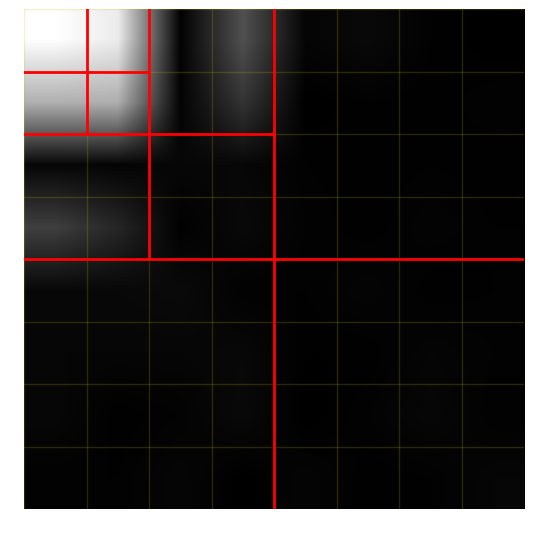

In [344]:
# Plot the coeffs 

fig = plt.figure(frameon=False)
fig.set_size_inches(5,5)
ax = plt.Axes(fig, [0., 0., 1, 1])
ax.set_axis_off()
fig.add_axes(ax)


coeffs_patch1 =np.copy(coeffs_patch)
coeffs_patch1[0,0] = 200
coeffs_patch1[3,0] = coeffs_patch1[3,0]*2



plt.imshow(rescale_image(np.abs(coeffs_patch1) ), 'gray')
plt.ylim(7.5, -.5)
plt.xlim( -.5, 7.5)
plt.axis('off')

for i in range(8):
    plt.plot([i-.5,i-.5],[-.5,7.5], 'y', alpha = .2)
    plt.plot([-.5,7.5], [i-.5,i-.5],'y', alpha = .2)
        
plt.plot([3.5,3.5],[-.5,7.5], 'r', linewidth = 2)
plt.plot([-.5,7.5],[3.5,3.5], 'r', linewidth = 2)
plt.plot([1.5,1.5],[-.5,3.5], 'r', linewidth = 2)
plt.plot([-.5,3.5],[1.5,1.5],'r', linewidth = 2)
plt.plot([.5,.5],[-.5,1.5], 'r', linewidth = 2)
plt.plot([-.5,1.5],[.5,.5],'r', linewidth = 2)





plt.savefig('coeffs_patch.png')